# 🛒 BigBasket Exploratory Data Analysis (EDA)

In [1]:
# importing major libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# additional libraries
import warnings
warnings.filterwarnings('ignore')

In [2]:
#importing dataset
df = pd.read_csv('BigBasket.csv')

# Data Assessing

#### About Company
BigBasket is one of India’s largest online grocery and supermarket companies, known for delivering fresh produce, household essentials and everyday groceries right to customers’ doorsteps.


- What BigBasket Does ?


BigBasket operates as an online supermarket where users can shop for thousands of items — from fresh fruits and vegetables to packaged foods, dairy, personal care and household products. Orders can be placed via the website or mobile app, and deliveries are made directly to customers’ homes.

In [3]:
# overview data
df.head()

,index,product,category,sub_category,brand,sale_price,market_price,type,rating,description
0,1,Garlic Oil - Vegetarian Capsule 500 mg,Beauty & Hygiene,Hair Care,Sri Sri Ayurveda,220.0,220.0,Hair Oil & Serum,4.1,This Product contains Garlic Oil that is known...
1,2,Water Bottle - Orange,"Kitchen, Garden & Pets",Storage & Accessories,Mastercook,180.0,180.0,Water & Fridge Bottles,2.3,"Each product is microwave safe (without lid), ..."
2,3,"Brass Angle Deep - Plain, No.2",Cleaning & Household,Pooja Needs,Trm,119.0,250.0,Lamp & Lamp Oil,3.4,"A perfect gift for all occasions, be it your m..."
3,4,Cereal Flip Lid Container/Storage Jar - Assort...,Cleaning & Household,Bins & Bathroom Ware,Nakoda,149.0,176.0,"Laundry, Storage Baskets",3.7,Multipurpose container with an attractive desi...
4,5,Creme Soft Soap - For Hands & Body,Beauty & Hygiene,Bath & Hand Wash,Nivea,162.0,162.0,Bathing Bars & Soaps,4.4,Nivea Creme Soft Soap gives your skin the best...


In [4]:
#shape 
df.shape

(27555, 10)

In [5]:
df.columns

Index(['index', 'product', 'category', 'sub_category', 'brand', 'sale_price',
       'market_price', 'type', 'rating', 'description'],
      dtype='object')

# Data Card – BigBasket Product Dataset

## Dataset Name
**BigBasket Product Listings Dataset**

---

## Dataset Description
This dataset contains detailed information about products listed on **BigBasket**, one of India’s largest online grocery and retail platforms.  
It includes product names, categories, sub-categories, brand details, pricing information, customer ratings, and product descriptions.

The dataset can be used for **Exploratory Data Analysis (EDA)**, **price comparison**, **product categorization**, **customer rating analysis**, and **recommendation system development**.

---

## Source of Data
- Extracted from BigBasket product listings  
- Represents e-commerce grocery and household product data  

---

## Number of Records
- **Total Records:** N  
- Each row represents one unique product  

---

## Number of Features
- **Total Features:** 10  

---

## Dataset Structure
The dataset is organized in a tabular format where each row corresponds to a single product and each column represents a specific attribute of that product.

---

## Feature Description

| Column Name | Description |
|------------|-------------|
| index | Unique numerical identifier for each product |
| product | Name of the product |
| category | Main product category |
| sub_category | Sub-category within the main category |
| brand | Brand or manufacturer name |
| sale_price | Selling price of the product (INR) |
| market_price | Original market price (MRP) of the product (INR) |
| type | Product type or functional classification |
| rating | Average customer rating (1–5 scale) |
| description | Textual description of product features |

---

## Data Types Overview

| Feature | Data Type |
|-------|----------|
| index | Integer |
| product | Categorical (Text) |
| category | Categorical |
| sub_category | Categorical |
| brand | Categorical |
| sale_price | Numerical (Float) |
| market_price | Numerical (Float) |
| type | Categorical |
| rating | Numerical (Float) |
| description | Text |

---


## 📌 Types of Data Errors

### ✅ Summary Table

| Error Type    | Description                | Example              |
| ------------- | -------------------------- | -------------------- |
| Completeness  | Missing data               | Age = NULL           |
| Validity      | Rule or datatype violation | Salary = -10000      |
| Accuracy      | Unrealistic values         | Age = 200            |
| Inconsistency | Multiple formats           | NYC vs New York City |

---

In [6]:
# Seaking Information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27555 entries, 0 to 27554
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   index         27555 non-null  int64  
 1   product       27554 non-null  object 
 2   category      27555 non-null  object 
 3   sub_category  27555 non-null  object 
 4   brand         27554 non-null  object 
 5   sale_price    27549 non-null  float64
 6   market_price  27555 non-null  float64
 7   type          27555 non-null  object 
 8   rating        18919 non-null  float64
 9   description   27440 non-null  object 
dtypes: float64(3), int64(1), object(6)
memory usage: 2.1+ MB


## Data Quality Observations – BigBasket Product Dataset

### Completeness
- Missing values observed in **product**, **brand**, **sale_price**, **rating**, and **description** columns.
- **Rating** has a significant number of missing values, indicating many unrated products.

### Accuracy
- Missing **sale_price** can affect price and discount analysis.
- Incomplete **product** or **brand** information may impact product-level insights.

### Validity
- **Rating** values should fall within an expected range (e.g., 1–5).
- **Sale price** should not exceed **market price**; such cases need validation.

### Consistency
- Text columns may contain inconsistent naming or formatting.
- Products with equal **sale_price** and **market_price** indicate no discount and should be checked for consistency.

---


In [7]:
# Seeking description
df.describe()

,index,sale_price,market_price,rating
count,27555.00000,27549.000000,27555.000000,18919.000000
mean,13778.00000,334.648391,382.056664,3.943295
std,7954.58767,1202.102113,581.730717,0.739217
min,1.00000,2.450000,3.000000,1.000000
25%,6889.50000,95.000000,100.000000,3.700000
50%,13778.00000,190.320000,220.000000,4.100000
75%,20666.50000,359.000000,425.000000,4.300000
max,27555.00000,112475.000000,12500.000000,5.000000


In [8]:
# Completness
df.isnull().sum().sum()
# Percentage
df.isnull().mean()*100

index            0.000000
product          0.003629
category         0.000000
sub_category     0.000000
brand            0.003629
sale_price       0.021775
market_price     0.000000
type             0.000000
rating          31.340954
description      0.417347
dtype: float64

In [9]:
df['product'].fillna('Unknown Product', inplace=True)
df['brand'].fillna('Unknown Brand', inplace=True)

In [10]:
df['sale_price'].fillna(df['market_price'], inplace=True)

In [11]:
df['description'].fillna('', inplace=True)

In [12]:
# Completness
df.isnull().sum().sum()
# Percentage
df.isnull().mean()*100

index            0.000000
product          0.000000
category         0.000000
sub_category     0.000000
brand            0.000000
sale_price       0.000000
market_price     0.000000
type             0.000000
rating          31.340954
description      0.000000
dtype: float64

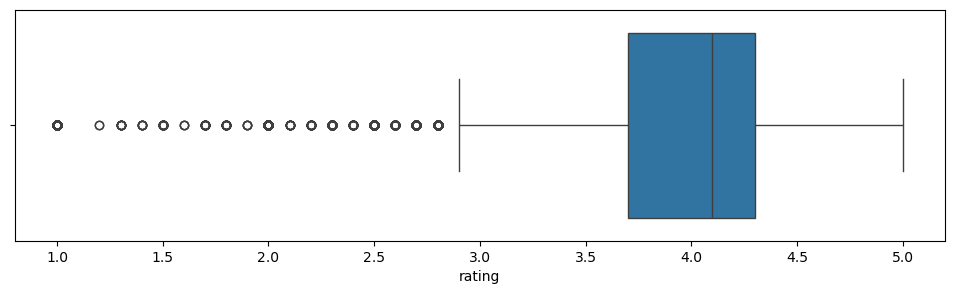

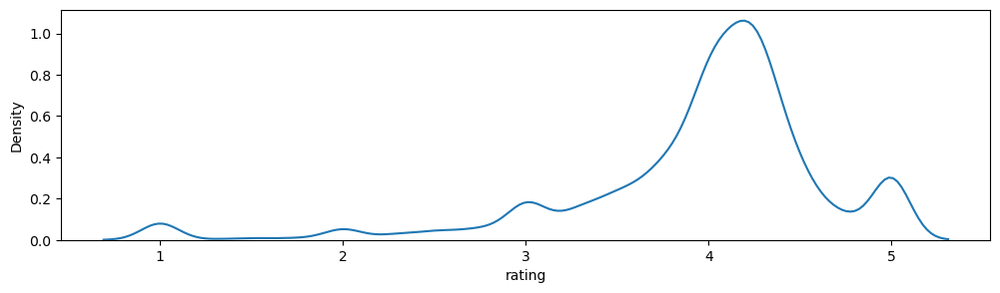

np.float64(-1.73020990761911)

In [13]:
plt.figure(figsize=(12,3))
sns.boxplot(x=df.rating)
plt.show()
plt.figure(figsize=(12,3))
sns.kdeplot(x=df.rating)
plt.show()
df.rating.skew()

In [14]:
#CORRECT PRICEING
df.loc[df['sale_price'] > df['market_price'], 'sale_price'] = df['market_price']


In [15]:
df.duplicated().sum()
df.drop_duplicates(inplace=True)


# Data Analysis & Visualization

## Univariate Analysis

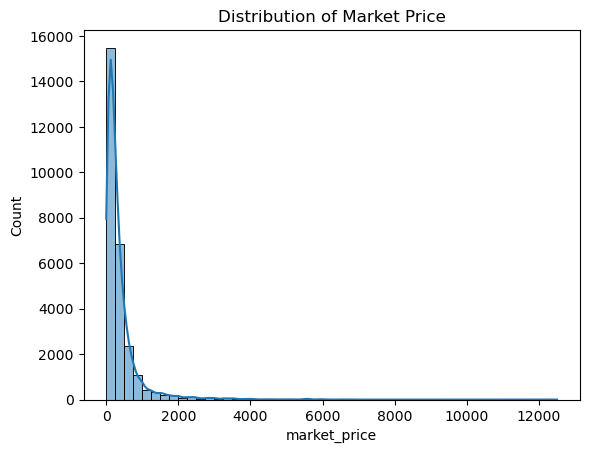

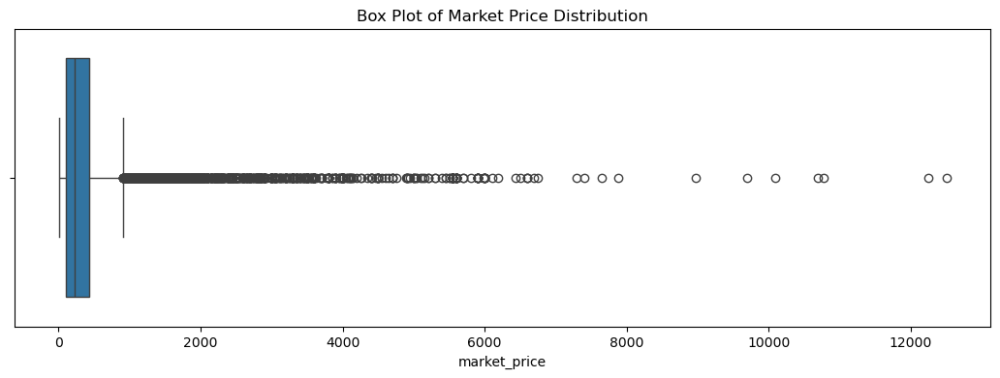

np.float64(5.788868514337814)

In [16]:
# Univariate Analysis
# Numerical columns
# Distribution
# Market Price
plt.title("Distribution of Market Price")
sns.histplot(df.market_price,bins=50,kde=True)
plt.show()

plt.figure(figsize=(13,4))
plt.title("Box Plot of Market Price Distribution")
sns.boxplot(x=df.market_price)
plt.show()
df.market_price.skew()

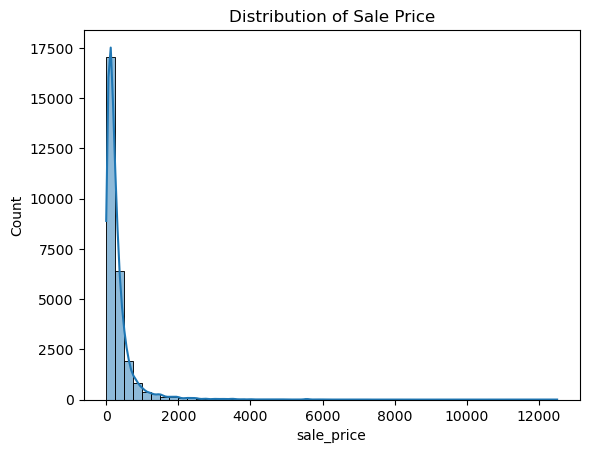

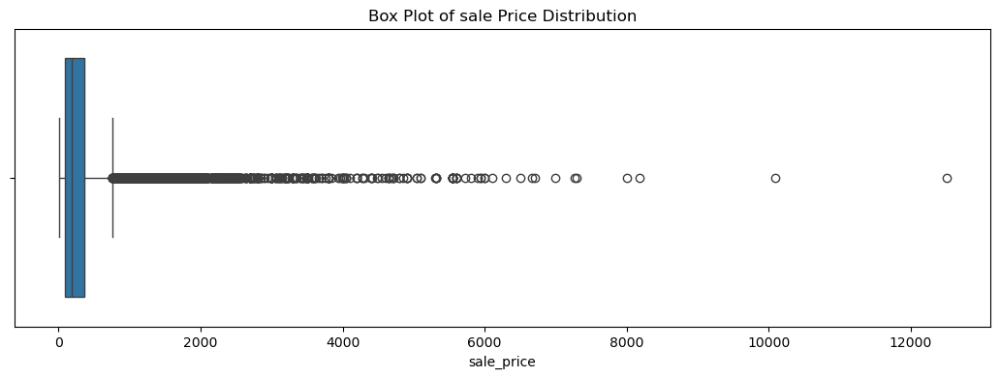

np.float64(6.17469685556941)

In [17]:
# Sale Price
plt.title("Distribution of Sale Price")
sns.histplot(df.sale_price,bins=50,kde=True)
plt.show()

plt.figure(figsize=(13,4))
plt.title("Box Plot of sale Price Distribution")
sns.boxplot(x=df.sale_price)
plt.show()
df.sale_price.skew()

## Insights – Market Price and Sale Price

- Market price is generally higher than or equal to sale price, confirming the presence of discounts across most products.
- Sale price closely follows market price, indicating a strong linear pricing relationship.
- The majority of products are concentrated in lower to mid price ranges, suggesting a mass-market pricing strategy.
- A small number of products show very high market and sale prices, which appear as outliers in box plots.
- Equal market and sale prices indicate products sold without discounts, commonly seen in daily-use or essential items.


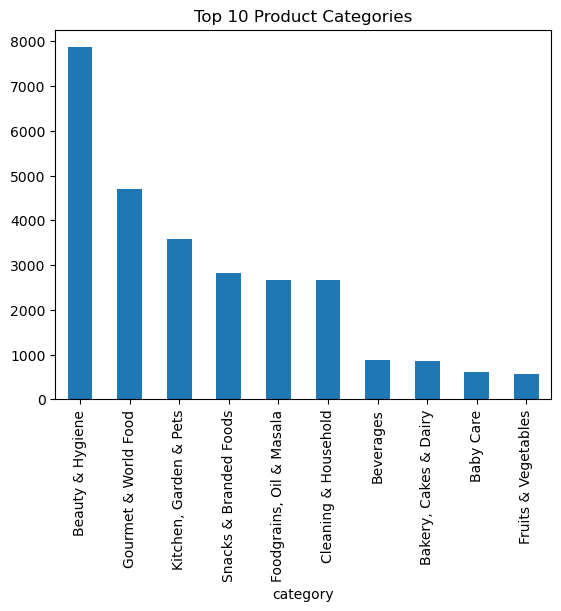

In [18]:
# Category
df['category'].value_counts().head(10).plot(kind='bar')
plt.title("Top 10 Product Categories")
plt.show()


## Insights – Top 10 Product Categories
- A small number of categories contribute to a large proportion of products listed on BigBasket.
- This indicates that BigBasket focuses heavily on high-demand everyday categories such as household and personal care items.
- Category dominance suggests strong customer demand and frequent purchases in these segments.

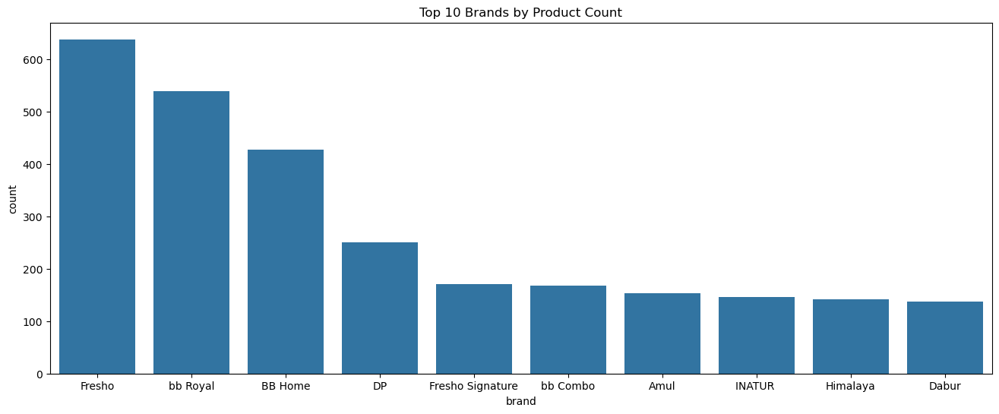

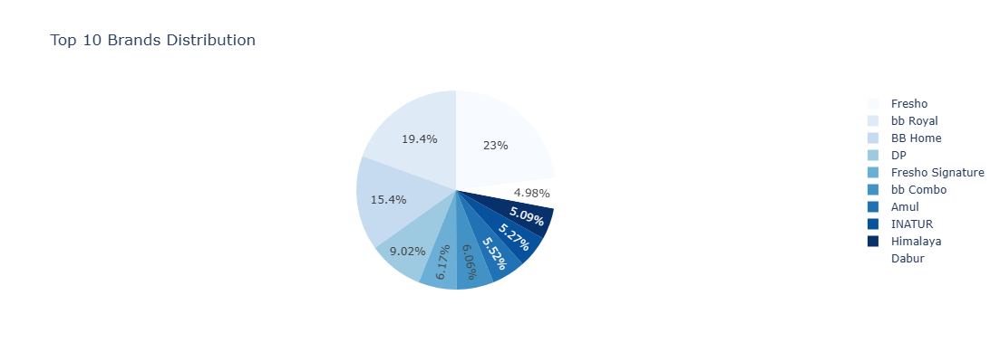

In [19]:
#BRAND
plt.figure(figsize=(16,6))
sns.countplot(data=df, x='brand', order=df['brand'].value_counts().head(10).index)
plt.title("Top 10 Brands by Product Count")
plt.show()

temp = df['brand'].value_counts().head(10).reset_index()
temp.columns = ['brand', 'count']
temp
px.pie(temp,names='brand',values='count',
       color_discrete_sequence=px.colors.sequential.Blues,
       height=400,title='Top 10 Brands Distribution')


## Insights – Top 10 Brands
- Only a few brands appear repeatedly across the dataset, showing brand concentration.
- Popular brands likely have higher customer trust and better availability on the platform.
- The presence of dominant brands suggests that BigBasket prioritizes well-known and reliable suppliers.

# Bivariate Analysis

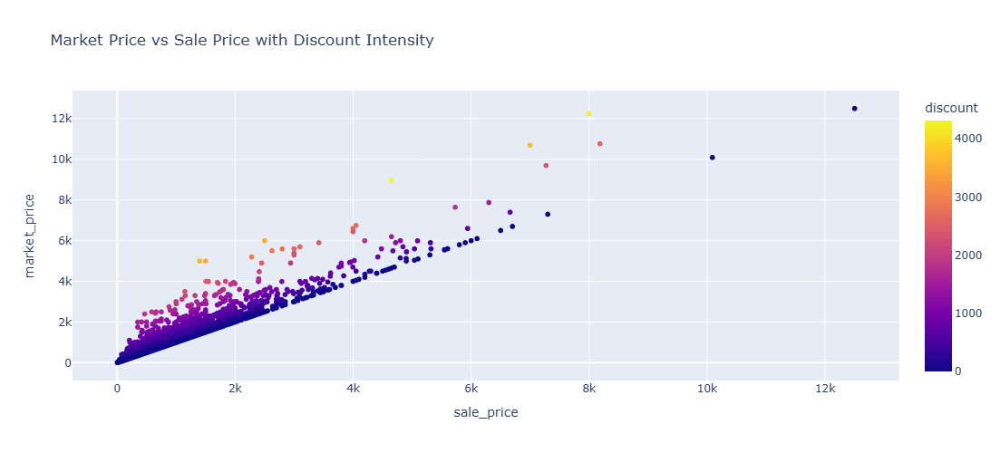

In [20]:
#plotly
df['discount'] = df['market_price'] - df['sale_price']

px.scatter(df,x='sale_price', y='market_price',color='discount',
    hover_data=['product','sale_price','market_price','discount'],
    height=500,
    title='Market Price vs Sale Price with Discount Intensity')


- A sale price lower than the market price indicates the presence of discounts, which is a common pricing strategy in e-commerce platforms to drive customer demand and increase sales volume.


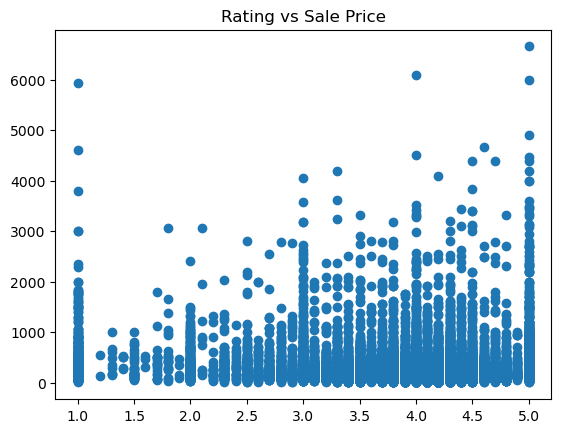

In [21]:
# Rating vs sale price
plt.scatter(df['rating'], df['sale_price'])
plt.title("Rating vs Sale Price")
plt.show()


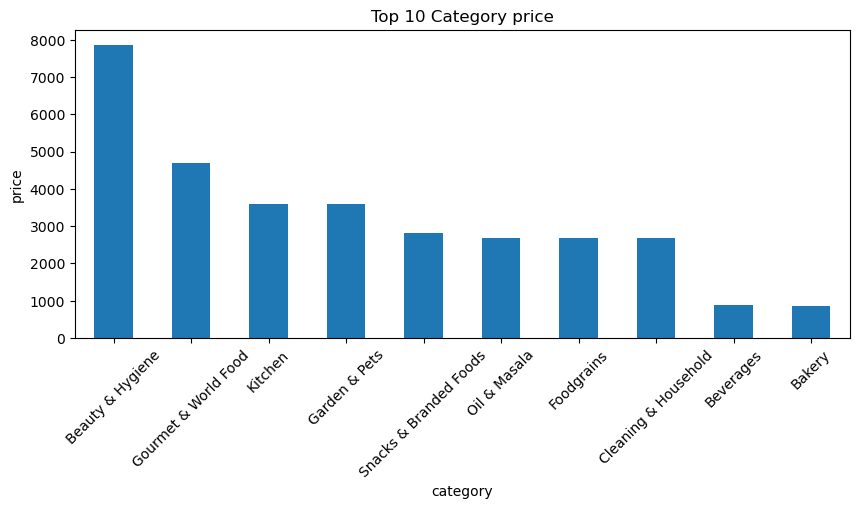

In [22]:
#Top 10 Category price
category = df['category'].str.split(', ').explode().value_counts().head(10)

plt.figure(figsize=(10,4))
category.plot(kind='bar')
plt.title('Top 10 Category price')
plt.xlabel('category')
plt.ylabel('price')
plt.xticks(rotation=45)
plt.show()

# Multivariate Analysis

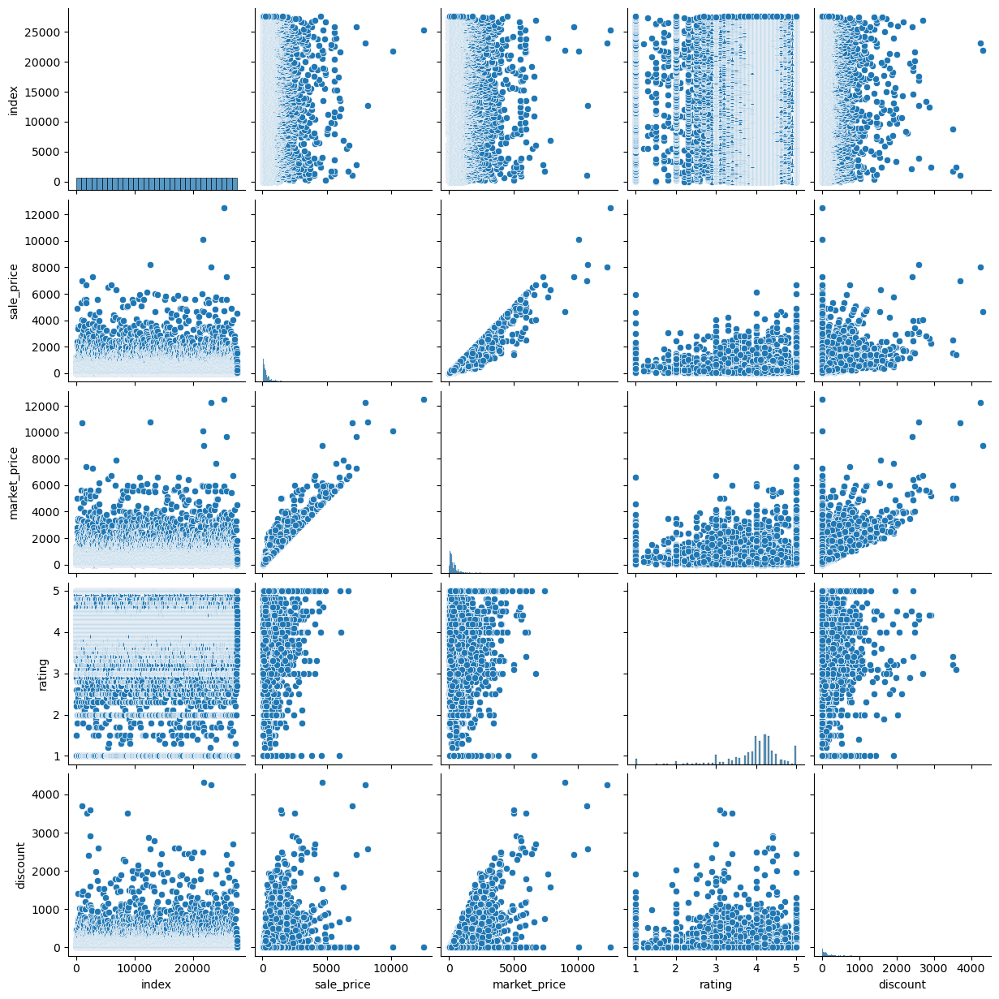

In [23]:
# multivariate analysis

sns.pairplot(df)
plt.show()

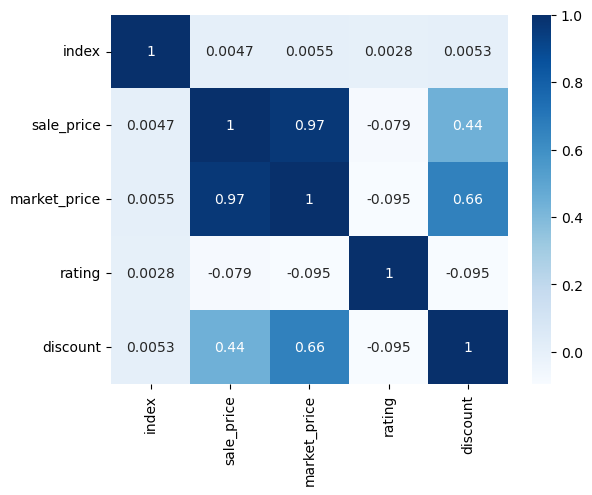

In [24]:
# corr
# heat map
sns.heatmap(df.corr(numeric_only=True),cmap="Blues",annot=True)
plt.show()

## Correlation Analysis (Heatmap Summary)

- **Sale Price & Market Price:** Strong positive correlation (0.97), both increase together.
- **Discount & Market Price:** Moderate positive correlation (0.66).
- **Discount & Sale Price:** Moderate positive correlation (0.44).
- **Rating & Prices:** Very weak negative correlation, almost no relationship.
- **Rating & Discount:** Very weak negative correlation.
- **Index:** No meaningful correlation, can be removed.

**Conclusion:**  
Market price strongly influences sale price, discount has moderate impact, and rating is independent of price factors.


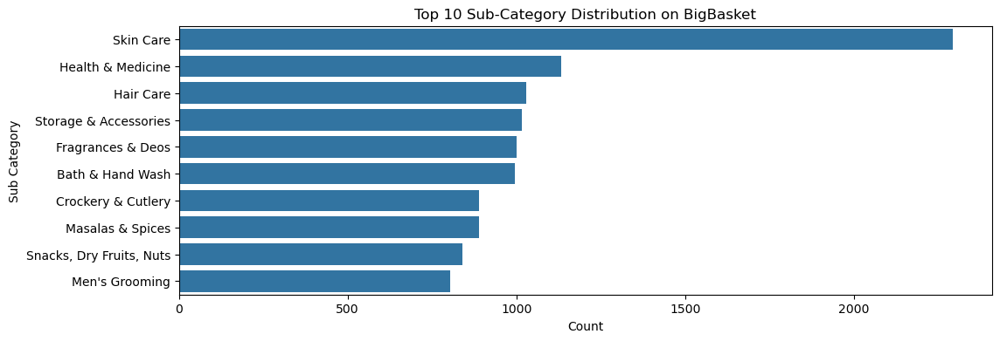

,sub_category,count
0,Skin Care,2294
1,Health & Medicine,1133
2,Hair Care,1028
3,Storage & Accessories,1015
4,Fragrances & Deos,1000
5,Bath & Hand Wash,996
6,Crockery & Cutlery,890
7,Masalas & Spices,889
8,"Snacks, Dry Fruits, Nuts",840
9,Men's Grooming,805


In [25]:
# Top 10 Sub-Categories
temp = df['sub_category'].value_counts().head(10).reset_index()
temp.columns = ['sub_category', 'count']
plt.figure(figsize=(12,4))
sns.countplot(data=df,y='sub_category',order=temp['sub_category'])
plt.title('Top 10 Sub-Category Distribution on BigBasket')
plt.xlabel('Count')
plt.ylabel('Sub Category')
plt.show()

# Pie chart
px.pie(temp,values='count',names='sub_category',height=400,
    color_discrete_sequence=px.colors.sequential.RdBu,hole=0.5,
    title='Top 10 Sub-Category Listing Distribution on BigBasket').show()
temp


## Top 10 Sub-Category Insights (BigBasket)

- A few sub-categories dominate the product listings.
- The top sub-category has the highest number of products, showing strong demand.
- Product distribution is uneven, indicating a long-tail pattern.
- BigBasket focuses more on daily-need sub-categories.
- Lower-ranked sub-categories have significantly fewer listings.

**Conclusion:**  
BigBasket’s inventory is concentrated in popular sub-categories, reflecting customer demand and core business focus.


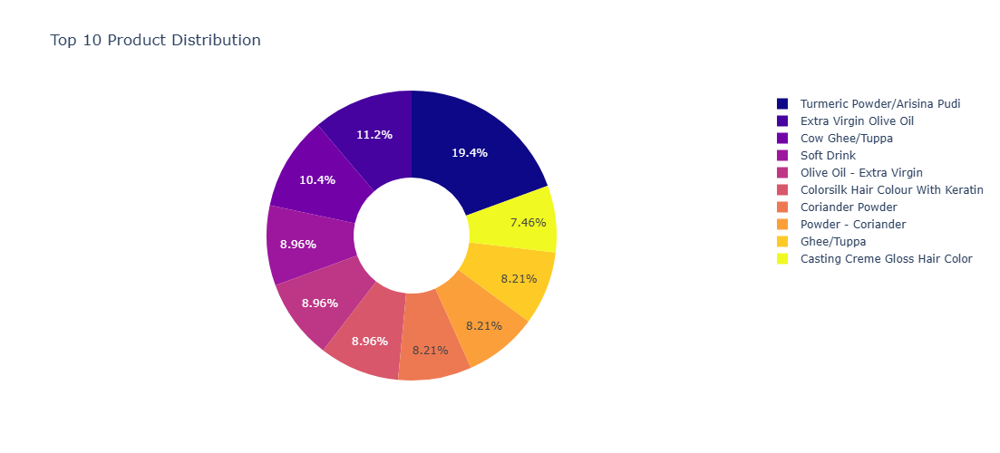

In [31]:
# Top 10 products by frequency
temp = df['product'].value_counts().head(10).reset_index()
temp.columns = ['product', 'count']
px.pie(temp,names='product',values='count',title='Top 10 Product Distribution',hole=0.4,
    color_discrete_sequence=px.colors.sequential.Plasma,height=500).show()


## Top 10 Product Insights

- A small number of products dominate the total listings.
- The top products indicate high customer demand and popularity.
- Product distribution follows a skewed pattern, with few products contributing most of the volume.
- High-priced products appear less frequently compared to mid-range products.
- BigBasket focuses inventory on fast-moving and essential products.

**Conclusion:**  
The Top 10 products represent BigBasket’s core offerings and drive the majority of platform activity.


# Conclusion

- **This project analyzed BigBasket product data through univariate, bivariate, and multivariate analysis.
Data cleaning improved reliability by addressing missing values and pricing inconsistencies.
Visual insights reveal strong category dominance, pricing strategies, and customer rating behavior.
The dataset is suitable for recommendation systems, pricing optimization, and market analysis.**
